In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cvxpy as cp

In [7]:
# For data preprocess import
import re
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk

In [8]:
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [9]:
from string import punctuation
from nltk.corpus import stopwords, wordnet
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import contractions

In [10]:
import nltk
nltk.download('punkt')
import nltk
nltk.download('averaged_perceptron_tagger')

from datasets import load_dataset

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [11]:
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt

%matplotlib inline

# DATA IMPORT

In [12]:
import pandas as pd

In [13]:
# Load the large Twitter sentiment dataset
ds = load_dataset("gxb912/large-twitter-tweets-sentiment")

# Convert HuggingFace dataset to pandas DataFrame
twitter_df = pd.DataFrame(ds['train'])

# Print info about the Twitter dataset
print("Twitter Dataset Info:")
print(twitter_df.shape)
print("\nLabel distribution:")
print(twitter_df['sentiment'].value_counts())
print("\nColumns:", twitter_df.columns.tolist())

README.md:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

train.csv:   0%|          | 0.00/14.6M [00:00<?, ?B/s]

test.csv:   0%|          | 0.00/3.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/179995 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/44999 [00:00<?, ? examples/s]

Twitter Dataset Info:
(179995, 2)

Label distribution:
sentiment
1    104125
0     75870
Name: count, dtype: int64

Columns: ['sentiment', 'text']


In [14]:
# Load our TikTok Shop Twitter dataset
tiktok_df = pd.read_csv(r'F:\Uni Stuff\BUSINESS CASE_GROUP PROJECT\Dataset _tiktokshop.csv' )
print("\nTikTok Dataset Info:")
print(tiktok_df.shape)
print("\nTikTok columns:", tiktok_df.columns.tolist())


TikTok Dataset Info:
(1003, 15)

TikTok columns: ['conversation_id_str', 'created_at', 'favorite_count', 'full_text', 'id_str', 'image_url', 'in_reply_to_screen_name', 'lang', 'location', 'quote_count', 'reply_count', 'retweet_count', 'tweet_url', 'user_id_str', 'username']


In [15]:
# Create a template DataFrame with all columns from our TikTok dataset
twitter_template = pd.DataFrame(columns=tiktok_df.columns)

In [16]:
# Prepare Twitter data to match our format
twitter_processed = twitter_template.copy()
twitter_processed['full_text'] = twitter_df['text']
twitter_processed['label'] = twitter_df['sentiment'].map({'negative': 'neg', 'positive': 'pos'})
# Fill other columns with NaN or appropriate default values
twitter_processed['conversation_id_str'] = 'twitter_' + twitter_df.index.astype(str)
twitter_processed['created_at'] = pd.Timestamp.now() 
twitter_processed['favourite_count'] = 0
twitter_processed['id_str'] = 'twitter_' + twitter_df.index.astype(str)
twitter_processed['image_url'] = None 
twitter_processed['in_reply_to_screen_name'] = None  
twitter_processed['lang'] = 'en'  
twitter_processed['location'] = None 
twitter_processed['quote_count'] = 0
twitter_processed['reply_count'] = 0
twitter_processed['retweet_count'] = 0
twitter_processed['tweet_url'] = None 
twitter_processed['user_id_str'] = 'twitter_user_' + twitter_df.index.astype(str)
twitter_processed['username'] = 'twitter_user'

# Add source column
twitter_processed['source'] = 'twitter_dataset'


In [17]:
# Now combine the datasets
combined_df = pd.concat([tiktok_df, twitter_processed], ignore_index=True)

In [18]:
# Remove duplicates based on text content
combined_df.drop_duplicates(subset='full_text', inplace=True)

In [19]:
# Shuffle the dataset
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

print("\nCombined Dataset Info:")
print(combined_df.shape)
print("\nLabel distribution:")
print(combined_df['label'].value_counts())


Combined Dataset Info:
(179585, 18)

Label distribution:
Series([], Name: count, dtype: int64)


In [20]:
# Save combined dataset
combined_df.to_csv('combined_twitter_tiktok_dataset.csv', index=False)

In [21]:
tweets = combined_df
tweets  

,conversation_id_str,created_at,favorite_count,full_text,id_str,image_url,in_reply_to_screen_name,lang,location,quote_count,reply_count,retweet_count,tweet_url,user_id_str,username,label,favourite_count,source
0,twitter_25913,2025-01-13 09:55:09.008925,NaN,@Glasgowlassy Have people comin round later bu...,twitter_25913,None,None,en,None,0,0,0,None,twitter_user_25913,twitter_user,NaN,0.0,twitter_dataset
1,twitter_168000,2025-01-13 09:55:09.008925,NaN,"@badexpat i do, damnit!",twitter_168000,None,None,en,None,0,0,0,None,twitter_user_168000,twitter_user,NaN,0.0,twitter_dataset
2,twitter_29754,2025-01-13 09:55:09.008925,NaN,@SofieY check dm then get back to me lol,twitter_29754,None,None,en,None,0,0,0,None,twitter_user_29754,twitter_user,NaN,0.0,twitter_dataset
3,twitter_4466,2025-01-13 09:55:09.008925,NaN,Yay Twitter is finally working for me!!,twitter_4466,None,None,en,None,0,0,0,None,twitter_user_4466,twitter_user,NaN,0.0,twitter_dataset
4,twitter_33100,2025-01-13 09:55:09.008925,NaN,ehhhh watching house with my mom and my headac...,twitter_33100,None,None,en,None,0,0,0,None,twitter_user_33100,twitter_user,NaN,0.0,twitter_dataset
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179580,twitter_119641,2025-01-13 09:55:09.008925,NaN,i slept the majority of the day i think i mig...,twitter_119641,None,None,en,None,0,0,0,None,twitter_user_119641,twitter_user,NaN,0.0,twitter_dataset
179581,twitter_103300,2025-01-13 09:55:09.008925,NaN,in phone-choosing hell and my contract doesn't...,twitter_103300,None,None,en,None,0,0,0,None,twitter_user_103300,twitter_user,NaN,0.0,twitter_dataset
179582,twitter_131818,2025-01-13 09:55:09.008925,NaN,"@angel0712 You know, Liz, Aussie Korean Liz, h...",twitter_131818,None,None,en,None,0,0,0,None,twitter_user_131818,twitter_user,NaN,0.0,twitter_dataset
179583,twitter_146909,2025-01-13 09:55:09.008925,NaN,@smileshutter Me too I'll go check it out,twitter_146909,None,None,en,None,0,0,0,None,twitter_user_146909,twitter_user,NaN,0.0,twitter_dataset


In [22]:
tweets.head()

,conversation_id_str,created_at,favorite_count,full_text,id_str,image_url,in_reply_to_screen_name,lang,location,quote_count,reply_count,retweet_count,tweet_url,user_id_str,username,label,favourite_count,source
0,twitter_25913,2025-01-13 09:55:09.008925,NaN,@Glasgowlassy Have people comin round later bu...,twitter_25913,None,None,en,None,0,0,0,None,twitter_user_25913,twitter_user,NaN,0.0,twitter_dataset
1,twitter_168000,2025-01-13 09:55:09.008925,NaN,"@badexpat i do, damnit!",twitter_168000,None,None,en,None,0,0,0,None,twitter_user_168000,twitter_user,NaN,0.0,twitter_dataset
2,twitter_29754,2025-01-13 09:55:09.008925,NaN,@SofieY check dm then get back to me lol,twitter_29754,None,None,en,None,0,0,0,None,twitter_user_29754,twitter_user,NaN,0.0,twitter_dataset
3,twitter_4466,2025-01-13 09:55:09.008925,NaN,Yay Twitter is finally working for me!!,twitter_4466,None,None,en,None,0,0,0,None,twitter_user_4466,twitter_user,NaN,0.0,twitter_dataset
4,twitter_33100,2025-01-13 09:55:09.008925,NaN,ehhhh watching house with my mom and my headac...,twitter_33100,None,None,en,None,0,0,0,None,twitter_user_33100,twitter_user,NaN,0.0,twitter_dataset


In [23]:
tweets_df = tweets[['full_text']]
tweets_df.head()

,full_text
0,@Glasgowlassy Have people comin round later bu...
1,"@badexpat i do, damnit!"
2,@SofieY check dm then get back to me lol
3,Yay Twitter is finally working for me!!
4,ehhhh watching house with my mom and my headac...


In [24]:
tweets_df.shape

(179585, 1)

# DATA PREPROCESSING

In [25]:
tweets.drop_duplicates(inplace = True, subset="full_text")
tweets.duplicated()



0         False
1         False
2         False
3         False
4         False
          ...  
179580    False
179581    False
179582    False
179583    False
179584    False
Length: 179585, dtype: bool

In [26]:
tweets_df

,full_text
0,@Glasgowlassy Have people comin round later bu...
1,"@badexpat i do, damnit!"
2,@SofieY check dm then get back to me lol
3,Yay Twitter is finally working for me!!
4,ehhhh watching house with my mom and my headac...
...,...
179580,i slept the majority of the day i think i mig...
179581,in phone-choosing hell and my contract doesn't...
179582,"@angel0712 You know, Liz, Aussie Korean Liz, h..."
179583,@smileshutter Me too I'll go check it out


In [27]:
#To view the information of data
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179585 entries, 0 to 179584
Data columns (total 1 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   full_text  179585 non-null  object
dtypes: object(1)
memory usage: 1.4+ MB


In [28]:
#To create dataframe
cleaned = tweets_df[["full_text"]]

#Rearrange the index
cleaned_df = cleaned.reset_index(drop = True)
cleaned_df

,full_text
0,@Glasgowlassy Have people comin round later bu...
1,"@badexpat i do, damnit!"
2,@SofieY check dm then get back to me lol
3,Yay Twitter is finally working for me!!
4,ehhhh watching house with my mom and my headac...
...,...
179580,i slept the majority of the day i think i mig...
179581,in phone-choosing hell and my contract doesn't...
179582,"@angel0712 You know, Liz, Aussie Korean Liz, h..."
179583,@smileshutter Me too I'll go check it out


In [29]:
#To remove NaN
cleaned_df = cleaned_df.dropna()

#To view the data after removing NaN
cleaned_df

,full_text
0,@Glasgowlassy Have people comin round later bu...
1,"@badexpat i do, damnit!"
2,@SofieY check dm then get back to me lol
3,Yay Twitter is finally working for me!!
4,ehhhh watching house with my mom and my headac...
...,...
179580,i slept the majority of the day i think i mig...
179581,in phone-choosing hell and my contract doesn't...
179582,"@angel0712 You know, Liz, Aussie Korean Liz, h..."
179583,@smileshutter Me too I'll go check it out


In [30]:
#Lowercase coversion
cleaned_df['lowercase'] = cleaned_df.full_text.str.lower()
cleaned_df.head()

,full_text,lowercase
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...
1,"@badexpat i do, damnit!","@badexpat i do, damnit!"
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...


In [31]:
#to convert the datatype to string
cleaned_df.full_text = cleaned_df.full_text.astype(str)

In [32]:
#Remove URL link
# Add this function after the imports
def clean_text(text):
    # Remove URLs
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    
    # Remove email addresses
    text = re.sub(r'\S+@\S+', '', text)
    
    # Remove numbers and special characters
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\d+', '', text)
    
    # Remove extra whitespace
    text = ' '.join(text.split())
    
    return text.strip().lower()

# Then apply it
cleaned_df['remove_link'] = cleaned_df['lowercase'].apply(clean_text)
                                                                                                                                              
cleaned_df.head()

,full_text,lowercase,remove_link
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...


In [33]:
#remove twitter handles (mention)
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
        
        return input_txt

In [34]:
#remove twitter handles (user)
cleaned_df['mention'] = np.vectorize(remove_pattern)(cleaned_df['remove_link'], "@[\w]*")

cleaned_df.head()

,full_text,lowercase,remove_link,mention
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None


In [35]:
import string
dir(string)

['Formatter',
 'Template',
 '_ChainMap',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_re',
 '_sentinel_dict',
 '_string',
 'ascii_letters',
 'ascii_lowercase',
 'ascii_uppercase',
 'capwords',
 'digits',
 'hexdigits',
 'octdigits',
 'printable',
 'punctuation',
 'whitespace']

In [36]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [37]:
for char in cleaned_df:
    if char in string.punctuation:
        cleaned_df = cleaned_df.replace(char, '')
        print(cleaned_df)

In [38]:
def clean_text(full_text):
    for char in full_text:
        full_text = full_text.replace(char, '')
        return full_text

In [39]:
cleaned_df.head()

,full_text,lowercase,remove_link,mention
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None


In [40]:
cleaned_df['remove_link'].apply(lambda x: clean_text(x))

0         lasowlassy have people comin round later but w...
1                                       adexpat i do damnit
2                    ofiey check dm then get back to me lol
3                        a twitter is finall working for me
4         hhhh watching hous with my mom and my hadach i...
                                ...                        
179580     slept the majorty of the day  thnk  mght be g...
179581    n phonechoosng hell and my contract doesnt eve...
179582    ngel you know liz ussie koren liz hs  lime tre...
179583                milehutter me too ill go check it out
179584                               rinceoftheoc thank you
Name: remove_link, Length: 179585, dtype: object

In [41]:
#Remove punctuation
cleaned_df['punctuation'] = cleaned_df.remove_link.apply(lambda x: re.sub(r"[^a-z\s\(\-:\)\\\/\];='#]", '', x))

cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...


In [42]:
cleaned_df['expand_word'] = cleaned_df['punctuation'].apply(lambda x: [contractions.fix(word) for word in x.split()])

In [43]:
cleaned_df['expand_word'] = [' '.join(map(str, l)) for l in cleaned_df['expand_word']]

cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...


In [44]:
#Remove #
cleaned_df['hashtag']= cleaned_df.expand_word.apply(lambda x: re.sub("#[A-Za-z0-9_]+","", x))

cleaned_df.head(3)

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol


In [45]:
#remove short word that has length word 2 or less
cleaned_df['remove_short'] = cleaned_df['hashtag'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))

cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...


In [46]:
#tokenization
import nltk
nltk.download('punkt_tab')

cleaned_df['tokenized'] = cleaned_df['remove_short'].apply(word_tokenize)
cleaned_df.head()

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat..."
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]"
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]"
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]"
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada..."


In [47]:
#Stop word library
nltk.download("stopwords")
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [48]:
#Stopword removal

import nltk
from nltk.corpus import stopwords
set(stopwords.words('english'))

#set of stop words
stop_words = set(stopwords.words('english'))

negation_words = ['not', 'no', 'never', 'none']
for word in negation_words:
    stop_words.discard(word)


cleaned_df['stopwords_removed'] = cleaned_df.tokenized.apply(lambda x: [word for word in x if word not in stop_words])

In [49]:
cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr..."
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]","[badexpat, damnit]"
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]"
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]","[yay, twitter, finally, working]"
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada...","[ehhhh, watching, house, mom, headache, back, ..."


In [50]:
#pos tag to label the type of word
import nltk
nltk.download('averaged_perceptron_tagger')

cleaned_df['pos_tags'] = cleaned_df['stopwords_removed'].apply(nltk.tag.pos_tag)
cleaned_df.head()

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB..."
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]","[badexpat, damnit]","[(badexpat, NN), (damnit, NN)]"
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ..."
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]","[yay, twitter, finally, working]","[(yay, RB), (twitter, NN), (finally, RB), (wor..."
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada...","[ehhhh, watching, house, mom, headache, back, ...","[(ehhhh, RB), (watching, VBG), (house, NN), (m..."


In [51]:
#To convert pos tag to word net to use lemmatizer
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [52]:
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
    
cleaned_df['wordnet_pos'] = cleaned_df['pos_tags'].apply(lambda x: [(word, get_wordnet_pos(pos_tag)) for (word, pos_tag) in x]) 

In [53]:
cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (..."
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]","[badexpat, damnit]","[(badexpat, NN), (damnit, NN)]","[(badexpat, n), (damnit, n)]"
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),..."
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]","[yay, twitter, finally, working]","[(yay, RB), (twitter, NN), (finally, RB), (wor...","[(yay, r), (twitter, n), (finally, r), (workin..."
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada...","[ehhhh, watching, house, mom, headache, back, ...","[(ehhhh, RB), (watching, VBG), (house, NN), (m...","[(ehhhh, r), (watching, v), (house, n), (mom, ..."


In [54]:
#Lemmatizer
wnl = WordNetLemmatizer()
cleaned_df['lemmatized'] = cleaned_df['wordnet_pos'].apply(lambda x: [wnl.lemmatize(word, tag) for word, tag in x])
cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","[glasgowlassy, people, comin, round, later, tr..."
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]","[badexpat, damnit]","[(badexpat, NN), (damnit, NN)]","[(badexpat, n), (damnit, n)]","[badexpat, damnit]"
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","[sofiey, check, get, back, lol]"
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]","[yay, twitter, finally, working]","[(yay, RB), (twitter, NN), (finally, RB), (wor...","[(yay, r), (twitter, n), (finally, r), (workin...","[yay, twitter, finally, work]"
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada...","[ehhhh, watching, house, mom, headache, back, ...","[(ehhhh, RB), (watching, VBG), (house, NN), (m...","[(ehhhh, r), (watching, v), (house, n), (mom, ...","[ehhhh, watch, house, mom, headache, back, baddd]"


In [55]:
#Saving dataframe in csv
cleaned_df.to_csv('Preprocessed_Data')
# tweets_df.to_excel("preprocessed_data.xlsx", index=False)

# Label Using Text Blob

In [56]:
#labelling library

import string
import nltk
import plotly.express as px
from nltk.sentiment.util import *

In [57]:
from wordcloud import WordCloud
import os
import pandas as pd
import numpy as np
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from textblob import TextBlob
from nltk import tokenize

In [58]:
cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","[glasgowlassy, people, comin, round, later, tr..."
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]","[badexpat, damnit]","[(badexpat, NN), (damnit, NN)]","[(badexpat, n), (damnit, n)]","[badexpat, damnit]"
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","[sofiey, check, get, back, lol]"
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]","[yay, twitter, finally, working]","[(yay, RB), (twitter, NN), (finally, RB), (wor...","[(yay, r), (twitter, n), (finally, r), (workin...","[yay, twitter, finally, work]"
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada...","[ehhhh, watching, house, mom, headache, back, ...","[(ehhhh, RB), (watching, VBG), (house, NN), (m...","[(ehhhh, r), (watching, v), (house, n), (mom, ...","[ehhhh, watch, house, mom, headache, back, baddd]"


In [59]:
#using polarity
from textblob import TextBlob

# Ensure the 'lemmatized' column is of type string
cleaned_df["lemmatized"] = cleaned_df["lemmatized"].astype("str")
cleaned_df['label'] = ''  # Initialize the 'label' column

# Iterate over the rows of the 'lemmatized' column using items()
for i, x in cleaned_df['lemmatized'].items():
    label = TextBlob(x)
    cleaned_df.at[i, 'label'] = label.sentiment.polarity  # Use .at to set the value
    print("Index: ", i, "label", label.sentiment.polarity)

Index:  0 label -0.1
Index:  1 label 0.0
Index:  2 label 0.4
Index:  3 label 0.0
Index:  4 label 0.0
Index:  5 label 0.6875
Index:  6 label 0.7
Index:  7 label 0.0
Index:  8 label 0.13636363636363635
Index:  9 label 0.0
Index:  10 label 0.0
Index:  11 label -0.5
Index:  12 label 0.2
Index:  13 label 0.0
Index:  14 label 0.0
Index:  15 label 0.1
Index:  16 label 0.0
Index:  17 label 0.1
Index:  18 label 1.0
Index:  19 label -0.5
Index:  20 label 0.5
Index:  21 label -0.04999999999999999
Index:  22 label 0.7
Index:  23 label 0.45999999999999996
Index:  24 label 0.0
Index:  25 label 0.39999999999999997
Index:  26 label 0.07873376623376624
Index:  27 label -0.25
Index:  28 label 0.0
Index:  29 label 0.0
Index:  30 label -0.35
Index:  31 label 0.0
Index:  32 label -0.25
Index:  33 label 0.4
Index:  34 label 0.0
Index:  35 label 0.075
Index:  36 label 0.0
Index:  37 label 0.0
Index:  38 label 0.0
Index:  39 label 0.19999999999999998
Index:  40 label -0.6
Index:  41 label -0.4458333333333333


In [60]:
cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized,label
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","['glasgowlassy', 'people', 'comin', 'round', '...",-0.1
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]","[badexpat, damnit]","[(badexpat, NN), (damnit, NN)]","[(badexpat, n), (damnit, n)]","['badexpat', 'damnit']",0.0
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","['sofiey', 'check', 'get', 'back', 'lol']",0.4
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]","[yay, twitter, finally, working]","[(yay, RB), (twitter, NN), (finally, RB), (wor...","[(yay, r), (twitter, n), (finally, r), (workin...","['yay', 'twitter', 'finally', 'work']",0.0
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada...","[ehhhh, watching, house, mom, headache, back, ...","[(ehhhh, RB), (watching, VBG), (house, NN), (m...","[(ehhhh, r), (watching, v), (house, n), (mom, ...","['ehhhh', 'watch', 'house', 'mom', 'headache',...",0.0


In [61]:
#to simplify the polarity become positive and negative

def polarity_to_label(x):
    if(x >= -1 and x < 0):
        return 'neg'
    if(x == 0):
        return 'neutral'
    if(x > 0 and x <= 1):
        return 'pos'
cleaned_df.label = cleaned_df.label.apply(polarity_to_label)

cleaned_df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized,label
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","['glasgowlassy', 'people', 'comin', 'round', '...",neg
1,"@badexpat i do, damnit!","@badexpat i do, damnit!",badexpat i do damnit,None,badexpat i do damnit,badexpat i do damnit,badexpat i do damnit,badexpat damnit,"[badexpat, damnit]","[badexpat, damnit]","[(badexpat, NN), (damnit, NN)]","[(badexpat, n), (damnit, n)]","['badexpat', 'damnit']",neutral
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","['sofiey', 'check', 'get', 'back', 'lol']",pos
3,Yay Twitter is finally working for me!!,yay twitter is finally working for me!!,yay twitter is finally working for me,None,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter is finally working for me,yay twitter finally working for,"[yay, twitter, finally, working, for]","[yay, twitter, finally, working]","[(yay, RB), (twitter, NN), (finally, RB), (wor...","[(yay, r), (twitter, n), (finally, r), (workin...","['yay', 'twitter', 'finally', 'work']",neutral
4,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,None,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with my mom and my headac...,ehhhh watching house with mom and headache bac...,"[ehhhh, watching, house, with, mom, and, heada...","[ehhhh, watching, house, mom, headache, back, ...","[(ehhhh, RB), (watching, VBG), (house, NN), (m...","[(ehhhh, r), (watching, v), (house, n), (mom, ...","['ehhhh', 'watch', 'house', 'mom', 'headache',...",neutral


In [62]:
cleaned_df.label.value_counts()

label
pos        81605
neutral    64604
neg        33376
Name: count, dtype: int64

<Axes: title={'center': 'Sentiment Analysis'}, xlabel='label'>

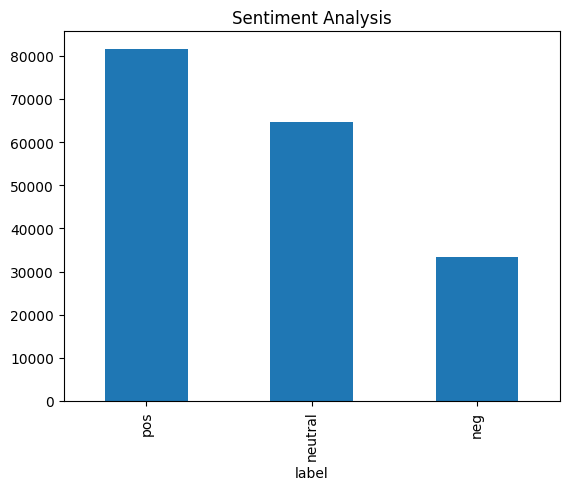

In [63]:
#visualise the label

cleaned_df.label.value_counts().plot(kind='bar',title="Sentiment Analysis")

In [64]:
#removing neutral label since prediction within this project revolve
#with neg and pos only
df = cleaned_df[cleaned_df.label !="neutral"]

df.count()

full_text            114981
lowercase            114981
remove_link          114981
mention                   0
punctuation          114981
expand_word          114981
hashtag              114981
remove_short         114981
tokenized            114981
stopwords_removed    114981
pos_tags             114981
wordnet_pos          114981
lemmatized           114981
label                114981
dtype: int64

In [65]:
df

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized,label
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","['glasgowlassy', 'people', 'comin', 'round', '...",neg
2,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","['sofiey', 'check', 'get', 'back', 'lol']",pos
5,@Sammii_xxx That's awesome news sweetheart! M...,@sammii_xxx that's awesome news sweetheart! m...,sammii_xxx thats awesome news sweetheart might...,None,sammiixxx thats awesome news sweetheart might ...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that awesome news sweetheart might h...,"[sammiixxx, that, awesome, news, sweetheart, m...","[sammiixxx, awesome, news, sweetheart, might, ...","[(sammiixxx, NN), (awesome, JJ), (news, NN), (...","[(sammiixxx, n), (awesome, a), (news, n), (swe...","['sammiixxx', 'awesome', 'news', 'sweetheart',...",pos
6,@libertygirl3 GOOD ONE- with the cleaners,@libertygirl3 good one- with the cleaners,libertygirl good one with the cleaners,None,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,"[libertygirl, good, one, with, the, cleaners]","[libertygirl, good, one, cleaners]","[(libertygirl, RB), (good, JJ), (one, CD), (cl...","[(libertygirl, r), (good, a), (one, n), (clean...","['libertygirl', 'good', 'one', 'cleaner']",pos
8,"@dboixel yup. See, u learned something new today","@dboixel yup. see, u learned something new today",dboixel yup see u learned something new today,None,dboixel yup see u learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,"[dboixel, yup, see, you, learned, something, n...","[dboixel, yup, see, learned, something, new, t...","[(dboixel, NN), (yup, NN), (see, VBP), (learne...","[(dboixel, n), (yup, n), (see, v), (learned, v...","['dboixel', 'yup', 'see', 'learn', 'something'...",pos
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179576,@scottrmcgrew you sad?,@scottrmcgrew you sad?,scottrmcgrew you sad,None,scottrmcgrew you sad,scottrmcgrew you sad,scottrmcgrew you sad,scottrmcgrew you sad,"[scottrmcgrew, you, sad]","[scottrmcgrew, sad]","[(scottrmcgrew, NN), (sad, NN)]","[(scottrmcgrew, n), (sad, n)]","['scottrmcgrew', 'sad']",neg
179577,"@zaneology awww yeah I tried, Im glad y'all ha...","@zaneology awww yeah i tried, im glad y'all ha...",zaneology awww yeah i tried im glad yall had f...,None,zaneology awww yeah i tried im glad yall had f...,zaneology awww yeah i tried i am glad you all ...,zaneology awww yeah i tried i am glad you all ...,zaneology awww yeah tried glad you all had fun...,"[zaneology, awww, yeah, tried, glad, you, all,...","[zaneology, awww, yeah, tried, glad, fun, guys...","[(zaneology, NN), (awww, NN), (yeah, NN), (tri...","[(zaneology, n), (awww, n), (yeah, n), (tried,...","['zaneology', 'awww', 'yeah

In [66]:
#rearrange the index

df = df.reset_index(drop=True)

In [67]:
df

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized,label
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","['glasgowlassy', 'people', 'comin', 'round', '...",neg
1,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","['sofiey', 'check', 'get', 'back', 'lol']",pos
2,@Sammii_xxx That's awesome news sweetheart! M...,@sammii_xxx that's awesome news sweetheart! m...,sammii_xxx thats awesome news sweetheart might...,None,sammiixxx thats awesome news sweetheart might ...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that awesome news sweetheart might h...,"[sammiixxx, that, awesome, news, sweetheart, m...","[sammiixxx, awesome, news, sweetheart, might, ...","[(sammiixxx, NN), (awesome, JJ), (news, NN), (...","[(sammiixxx, n), (awesome, a), (news, n), (swe...","['sammiixxx', 'awesome', 'news', 'sweetheart',...",pos
3,@libertygirl3 GOOD ONE- with the cleaners,@libertygirl3 good one- with the cleaners,libertygirl good one with the cleaners,None,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,"[libertygirl, good, one, with, the, cleaners]","[libertygirl, good, one, cleaners]","[(libertygirl, RB), (good, JJ), (one, CD), (cl...","[(libertygirl, r), (good, a), (one, n), (clean...","['libertygirl', 'good', 'one', 'cleaner']",pos
4,"@dboixel yup. See, u learned something new today","@dboixel yup. see, u learned something new today",dboixel yup see u learned something new today,None,dboixel yup see u learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,"[dboixel, yup, see, you, learned, something, n...","[dboixel, yup, see, learned, something, new, t...","[(dboixel, NN), (yup, NN), (see, VBP), (learne...","[(dboixel, n), (yup, n), (see, v), (learned, v...","['dboixel', 'yup', 'see', 'learn', 'something'...",pos
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114976,@scottrmcgrew you sad?,@scottrmcgrew you sad?,scottrmcgrew you sad,None,scottrmcgrew you sad,scottrmcgrew you sad,scottrmcgrew you sad,scottrmcgrew you sad,"[scottrmcgrew, you, sad]","[scottrmcgrew, sad]","[(scottrmcgrew, NN), (sad, NN)]","[(scottrmcgrew, n), (sad, n)]","['scottrmcgrew', 'sad']",neg
114977,"@zaneology awww yeah I tried, Im glad y'all ha...","@zaneology awww yeah i tried, im glad y'all ha...",zaneology awww yeah i tried im glad yall had f...,None,zaneology awww yeah i tried im glad yall had f...,zaneology awww yeah i tried i am glad you all ...,zaneology awww yeah i tried i am glad you all ...,zaneology awww yeah tried glad you all had fun...,"[zaneology, awww, yeah, tried, glad, you, all,...","[zaneology, awww, yeah, tried, glad, fun, guys...","[(zaneology, NN), (awww, NN), (yeah, NN), (tri...","[(zaneology, n), (awww, n), (yeah, n), (tried,...","['zaneology', 'awww', 'yeah

# Exploratory Data Analysis


In [68]:
df

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized,label
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","['glasgowlassy', 'people', 'comin', 'round', '...",neg
1,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","['sofiey', 'check', 'get', 'back', 'lol']",pos
2,@Sammii_xxx That's awesome news sweetheart! M...,@sammii_xxx that's awesome news sweetheart! m...,sammii_xxx thats awesome news sweetheart might...,None,sammiixxx thats awesome news sweetheart might ...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that awesome news sweetheart might h...,"[sammiixxx, that, awesome, news, sweetheart, m...","[sammiixxx, awesome, news, sweetheart, might, ...","[(sammiixxx, NN), (awesome, JJ), (news, NN), (...","[(sammiixxx, n), (awesome, a), (news, n), (swe...","['sammiixxx', 'awesome', 'news', 'sweetheart',...",pos
3,@libertygirl3 GOOD ONE- with the cleaners,@libertygirl3 good one- with the cleaners,libertygirl good one with the cleaners,None,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,"[libertygirl, good, one, with, the, cleaners]","[libertygirl, good, one, cleaners]","[(libertygirl, RB), (good, JJ), (one, CD), (cl...","[(libertygirl, r), (good, a), (one, n), (clean...","['libertygirl', 'good', 'one', 'cleaner']",pos
4,"@dboixel yup. See, u learned something new today","@dboixel yup. see, u learned something new today",dboixel yup see u learned something new today,None,dboixel yup see u learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,"[dboixel, yup, see, you, learned, something, n...","[dboixel, yup, see, learned, something, new, t...","[(dboixel, NN), (yup, NN), (see, VBP), (learne...","[(dboixel, n), (yup, n), (see, v), (learned, v...","['dboixel', 'yup', 'see', 'learn', 'something'...",pos
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114976,@scottrmcgrew you sad?,@scottrmcgrew you sad?,scottrmcgrew you sad,None,scottrmcgrew you sad,scottrmcgrew you sad,scottrmcgrew you sad,scottrmcgrew you sad,"[scottrmcgrew, you, sad]","[scottrmcgrew, sad]","[(scottrmcgrew, NN), (sad, NN)]","[(scottrmcgrew, n), (sad, n)]","['scottrmcgrew', 'sad']",neg
114977,"@zaneology awww yeah I tried, Im glad y'all ha...","@zaneology awww yeah i tried, im glad y'all ha...",zaneology awww yeah i tried im glad yall had f...,None,zaneology awww yeah i tried im glad yall had f...,zaneology awww yeah i tried i am glad you all ...,zaneology awww yeah i tried i am glad you all ...,zaneology awww yeah tried glad you all had fun...,"[zaneology, awww, yeah, tried, glad, you, all,...","[zaneology, awww, yeah, tried, glad, fun, guys...","[(zaneology, NN), (awww, NN), (yeah, NN), (tri...","[(zaneology, n), (awww, n), (yeah, n), (tried,...","['zaneology', 'awww', 'yeah

In [69]:
df.label.value_counts()

label
pos    81605
neg    33376
Name: count, dtype: int64

In [70]:
#To check null value

df.lemmatized.isnull().value_counts()

lemmatized
False    114981
Name: count, dtype: int64

In [71]:
df.shape

(114981, 14)

<Axes: title={'center': 'Sentiment Analysis'}, xlabel='label'>

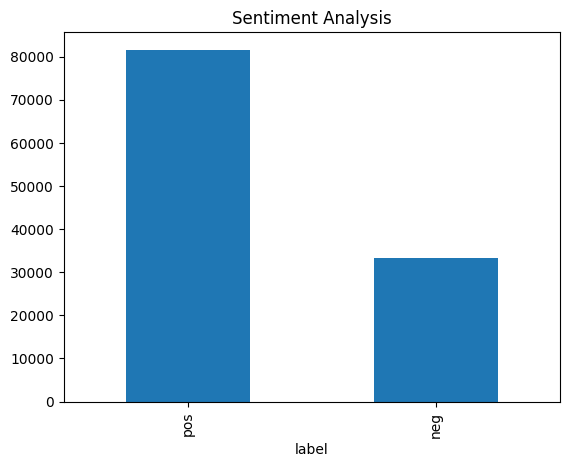

In [72]:
df.label.value_counts().plot(kind='bar',title="Sentiment Analysis")

In [73]:
#convert label to numeric values
df['label'] = df.label.map(lambda x: int(1) if x =='pos' 
                           else int(0) if x =='neg' else np.nan)
df.head()

,full_text,lowercase,remove_link,mention,punctuation,expand_word,hashtag,remove_short,tokenized,stopwords_removed,pos_tags,wordnet_pos,lemmatized,label
0,@Glasgowlassy Have people comin round later bu...,@glasgowlassy have people comin round later bu...,glasgowlassy have people comin round later but...,None,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,glasgowlassy have people comin round later but...,"[glasgowlassy, have, people, comin, round, lat...","[glasgowlassy, people, comin, round, later, tr...","[(glasgowlassy, JJ), (people, NNS), (comin, VB...","[(glasgowlassy, a), (people, n), (comin, v), (...","['glasgowlassy', 'people', 'comin', 'round', '...",0
1,@SofieY check dm then get back to me lol,@sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,None,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check dm then get back to me lol,sofiey check then get back lol,"[sofiey, check, then, get, back, lol]","[sofiey, check, get, back, lol]","[(sofiey, NN), (check, NN), (get, VB), (back, ...","[(sofiey, n), (check, n), (get, v), (back, r),...","['sofiey', 'check', 'get', 'back', 'lol']",1
2,@Sammii_xxx That's awesome news sweetheart! M...,@sammii_xxx that's awesome news sweetheart! m...,sammii_xxx thats awesome news sweetheart might...,None,sammiixxx thats awesome news sweetheart might ...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that is awesome news sweetheart migh...,sammiixxx that awesome news sweetheart might h...,"[sammiixxx, that, awesome, news, sweetheart, m...","[sammiixxx, awesome, news, sweetheart, might, ...","[(sammiixxx, NN), (awesome, JJ), (news, NN), (...","[(sammiixxx, n), (awesome, a), (news, n), (swe...","['sammiixxx', 'awesome', 'news', 'sweetheart',...",1
3,@libertygirl3 GOOD ONE- with the cleaners,@libertygirl3 good one- with the cleaners,libertygirl good one with the cleaners,None,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,libertygirl good one with the cleaners,"[libertygirl, good, one, with, the, cleaners]","[libertygirl, good, one, cleaners]","[(libertygirl, RB), (good, JJ), (one, CD), (cl...","[(libertygirl, r), (good, a), (one, n), (clean...","['libertygirl', 'good', 'one', 'cleaner']",1
4,"@dboixel yup. See, u learned something new today","@dboixel yup. see, u learned something new today",dboixel yup see u learned something new today,None,dboixel yup see u learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,dboixel yup see you learned something new today,"[dboixel, yup, see, you, learned, something, n...","[dboixel, yup, see, learned, something, new, t...","[(dboixel, NN), (yup, NN), (see, VBP), (learne...","[(dboixel, n), (yup, n), (see, v), (learned, v...","['dboixel', 'yup', 'see', 'learn', 'something'...",1


In [74]:
df= df[['lemmatized','label']]
df.head()

,lemmatized,label
0,"['glasgowlassy', 'people', 'comin', 'round', '...",0
1,"['sofiey', 'check', 'get', 'back', 'lol']",1
2,"['sammiixxx', 'awesome', 'news', 'sweetheart',...",1
3,"['libertygirl', 'good', 'one', 'cleaner']",1
4,"['dboixel', 'yup', 'see', 'learn', 'something'...",1


In [75]:
from sklearn.model_selection import train_test_split
lemmatize = df['lemmatized'].values
labels = df['label'].values
lemmatize_train, lemmatize_test, labels_train, labels_test = train_test_split(lemmatize, labels)

print(lemmatize_train.shape)
print(lemmatize_test.shape)
print(labels_train.shape)
print(labels_test.shape)

(86235,)
(28746,)
(86235,)
(28746,)


In [76]:
from sklearn.feature_extraction.text import TfidfVectorizer
lemmatizer = WordNetLemmatizer()
corpus=[]
messages = df.lemmatized.tolist()

for i in range(0, len(messages)):
    message = re.sub('[^a-zA-Z]', ' ', str(messages[i]))
    message = message.lower()
    message = message.split()
    message = [lemmatizer.lemmatize(word) for word in message if not word in stopwords.words('english')]
    message = ' '.join(message)
    corpus.append(message)

In [77]:
vectorizer = TfidfVectorizer(min_df = 5,
                              max_df = 0.8,
                              sublinear_tf = True,
                              use_idf = True)

In [78]:
tfidf = vectorizer.fit_transform(df.lemmatized)

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
vectorizer = vectorizer.fit(corpus)
X = vectorizer.transform(corpus)

X.shape

(114981, 101838)

In [81]:
y = df['label'].replace(0, -1)

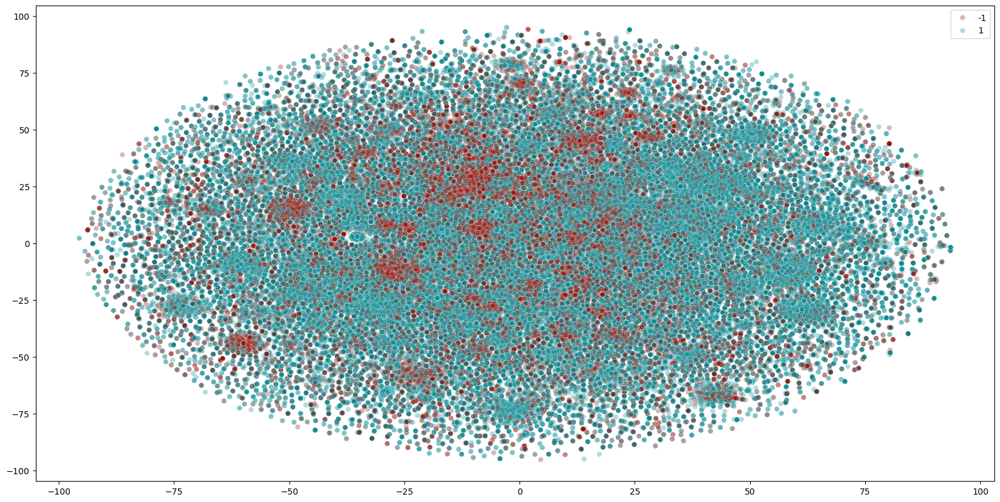

In [82]:
from sklearn.manifold import TSNE
import seaborn as sns
labels = y.to_list()
tsne_results = TSNE(n_components=2,init='random',random_state=0, perplexity=40).fit_transform(X)
plt.figure(figsize=(20,10))
palette = sns.hls_palette(2, l=.3, s=.9)
sns.scatterplot(
    x=tsne_results[:,0], y=tsne_results[:,1],
    hue=labels,
    palette= palette,
    legend="full",
    alpha=0.3
)
plt.show()

In [83]:
# Split dataset to Testing and Training

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

#70/30
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.30, random_state = 0)

In [84]:
X_train.shape

(80486, 101838)

In [85]:
X_test.shape

(34495, 101838)

# SVM Algorithm

In [86]:
from collections import Counter

In [87]:
print("Before SMOTE :" , Counter(y_train))

Before SMOTE : Counter({1: 57169, -1: 23317})


In [88]:
sm = SMOTE(random_state=2)
X_train, y_train = sm.fit_resample(X_train, y_train.ravel())

In [91]:
print("After SMOTE :" , Counter(y_train))

After SMOTE : Counter({np.int64(-1): 57169, np.int64(1): 57169})


In [92]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

# Create and train SVM model with linear kernel
svm_model = SVC(kernel='linear', C=1.0, random_state=42)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [93]:
# Make predictions
predictions = svm_model.predict(X_test)

In [94]:
# Print results
print("\nClassification Report:")
print(classification_report(y_test, predictions))
print("\nAccuracy Score:", accuracy_score(y_test, predictions))


Classification Report:
              precision    recall  f1-score   support

          -1       0.88      0.89      0.88     10059
           1       0.95      0.95      0.95     24436

    accuracy                           0.93     34495
   macro avg       0.91      0.92      0.92     34495
weighted avg       0.93      0.93      0.93     34495


Accuracy Score: 0.930714596318307


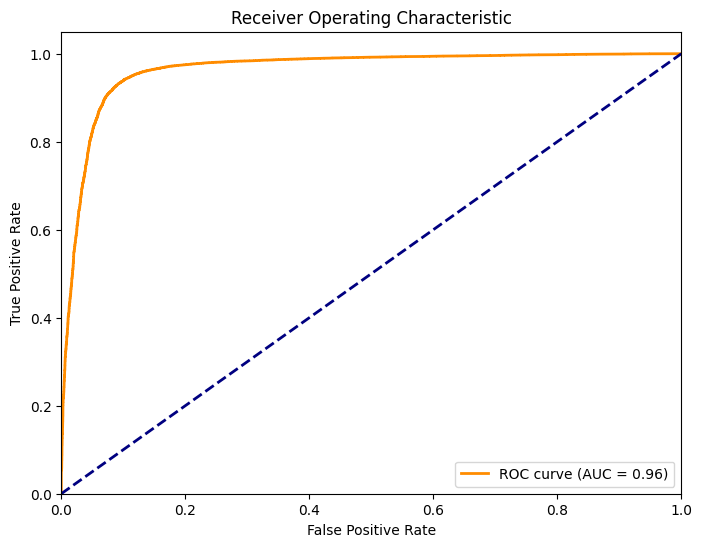

In [95]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, _ = roc_curve(y_test, svm_model.decision_function(X_test))
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

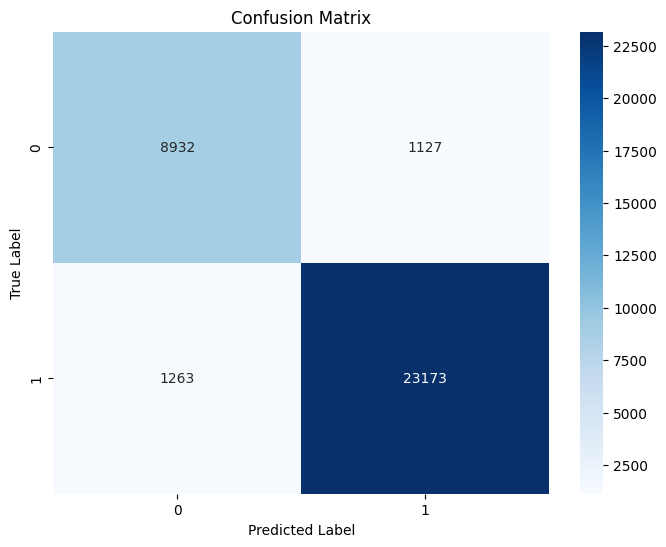

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# WORDCLOUD

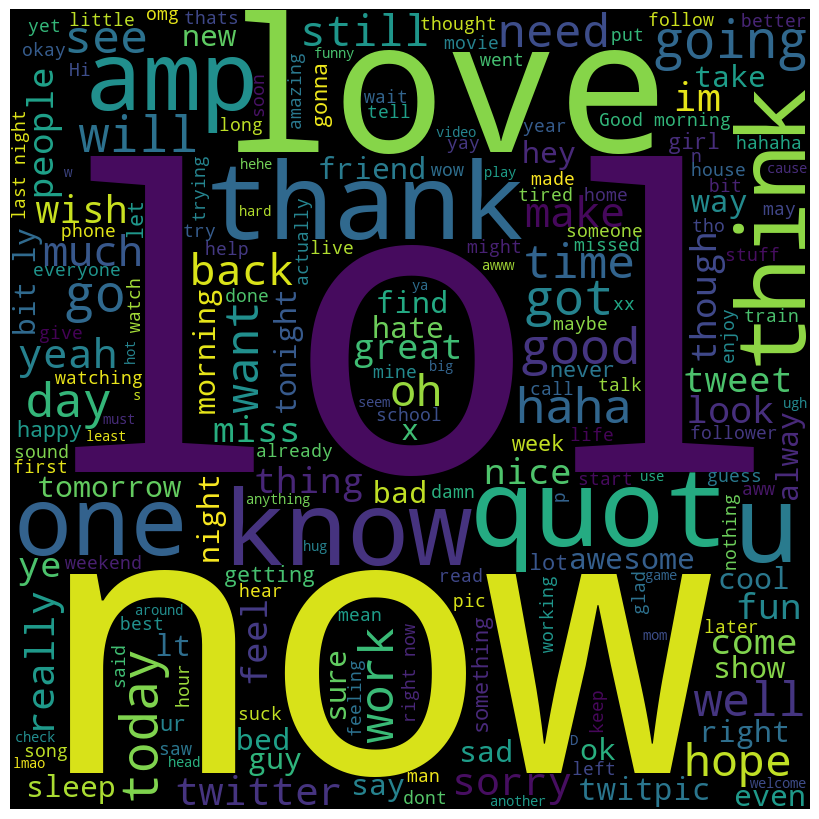

In [98]:
# import required libraries
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd

# read data into a dataframe
df = pd.read_csv(r'F:\Uni Stuff\BUSINESS CASE_GROUP PROJECT\Preprocessed_Data')

# combine all text into a single string
text = ' '.join(df['full_text'].tolist())

# create a WordCloud object
wordcloud = WordCloud(width=800, height=800,
                      background_color='black',
                      stopwords=STOPWORDS,
                      min_font_size=10).generate(text)

# plot the WordCloud image
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)

# show the plot
plt.show()


In [99]:
# Save the trained model and vectorizer
import pickle
import os

# Create model directory if it doesn't exist
if not os.path.exists('model'):
    os.makedirs('model')

# Save the SVM model
with open('model/svm_model_large.pkl', 'wb') as f:
    pickle.dump(svm_model, f)

# Save the TF-IDF vectorizer
with open('model/vectorizer_large.pkl', 'wb') as f:
    pickle.dump(vectorizer, f)

print("Model and vectorizer saved successfully!")

# Optional: Verify the files are saved
if os.path.exists('model/svm_model_large.pkl') and os.path.exists('model/vectorizer_large.pkl'):
    print("Files saved in:")
    print(f"- {os.path.abspath('model/svm_model_large.pkl')}")
    print(f"- {os.path.abspath('model/vectorizer_large.pkl')}")

Model and vectorizer saved successfully!
Files saved in:
- f:\Uni Stuff\BUSINESS CASE_GROUP PROJECT\model\svm_model.pkl
- f:\Uni Stuff\BUSINESS CASE_GROUP PROJECT\model\vectorizer.pkl
